In [1]:
# for folders one level below the heirarchy
import sys
import os 
current_dir = os.getcwd()
parent_dir = os.path.abspath(os.path.join(current_dir, os.pardir))
sys.path.append(parent_dir)

from aodfunctions.dependencies import *
from aodfunctions.general import *
from aodfunctions.settings import *
from aodfunctions.testbed import *
from aodfunctions.outofplane import *
# from aodfunctions.outofplane import *
from scipy.ndimage import zoom

cupyon=True

try: 
    import cupy as cp
    import cupyx.scipy.fft as cpfft
    import cupyx.scipy.ndimage
    from cupyx.scipy.ndimage import gaussian_filter1d as cp_gaussian_filter1d
    from cupyx.scipy.ndimage import gaussian_filter as cp_gaussian_filter
    from cupyx.scipy.ndimage import affine_transform as cp_affine_transform
    from cupy.lib.stride_tricks import as_strided

except ImportError:
    cp = np
    cpfft = spfft
    cp_gaussian_filter1d = sp_gaussian_filter1d
    cp_gaussian_filter = sp_gaussian_filter
    cp_affine_transform = sp_affine_transform
    cupyon = False
    from numpy.lib.stride_tricks import as_strided
    print("cupy not installed. Using numpy.")


# Set default plotting style
plt.style.use('seaborn-whitegrid')

# Set rcParams for scientific plotting
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({
    'figure.figsize': (10, 6),      # Default figure size
    'axes.titlesize': 16,           # Title font size
    'axes.labelsize': 14,           # Axes labels font size
    'lines.linewidth': 2,           # Line width
    'lines.markersize': 6,          # Marker size
    'xtick.labelsize': 12,          # X-tick labels font size
    'ytick.labelsize': 12,          # Y-tick labels font size
    'legend.fontsize': 12,          # Legend font size
    'font.family': 'serif',         # Font family
    'font.serif': ['Times New Roman'],
    'grid.alpha': 0.7,              # Grid transparency
    'grid.linestyle': '--',         # Grid line style
    'axes.grid': True,              # Show grid
    'savefig.dpi': 300,             # Save figure resolution
    'savefig.format': 'png'         # Default save format
})

import diffractsim
diffractsim.set_backend("CUDA") #Change the string to "CUDA" to use GPU acceleration

from diffractsim import MonochromaticField, Lens, nm, mm, cm, RectangularSlit


Cycletime in nanoseconds:  11538.461538461537
Aod pixel pitch in microns:  14.999999999999998
Fourier space spacing in microns:  0.09331054687500001
Fourier space aperture in microns:  382.20000000000005
Timestep in nanoseconds: 23.076923076923077


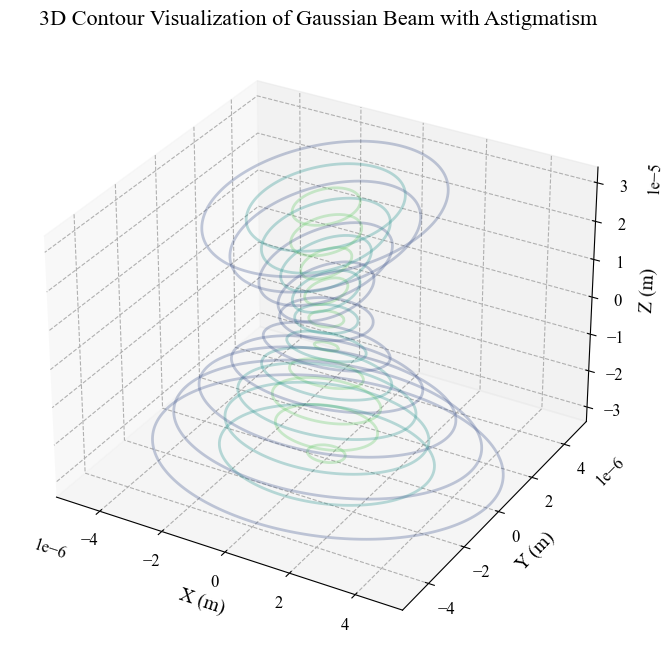

In [2]:
import numpy as np
import plotly.graph_objects as go

# Constants
lambda_light = 650e-9  # Wavelength of the light (in meters)
w0 = 1.3e-6  # Beam waist along x-axis (in meters)

# Adjustable astigmatism parameters
zR = np.pi * w0**2 / lambda_light  # Rayleigh range along x-axis
trap_X = 0
trap_dX = 1e-5

# Grid setup
z_range = np.linspace(-4 * zR, 4 * zR, 10)
x_range = np.linspace(-4*w0 + trap_X, 4*w0 + trap_X, 100)
y_range = np.linspace(-4*w0, 4*w0, 100)

X, Y = np.meshgrid(x_range, y_range)

# Beam intensity calculation with astigmatism
def beam_intensity(X, Y, Z, w0, zR, trap_X, trap_dX):
    Ry = w0 * np.sqrt(1 + (Z / zR)**2)
    Rx = w0 * np.sqrt(1 + ((Z - trap_dX) / zR)**2)
    return (w0**2 / (Rx * Ry)) * np.exp(-2 * (((X - trap_X) / Rx)**2 + (Y / Ry)**2))

# 3D Visualization with contour plots
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')


for z in z_range:
    I = beam_intensity(X, Y, z, w0, zR, trap_X, trap_dX)
    ax.contour(X, Y, I, levels=3, zdir='z', offset=z, cmap='viridis', alpha=0.3)

# Setting labels and title
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('3D Contour Visualization of Gaussian Beam with Astigmatism')

# Set limits for better visualization
ax.set_xlim([-4*w0 + trap_X, 4*w0 + trap_X])
ax.set_ylim([-4*w0, 4*w0])
ax.set_zlim([z_range.min(), z_range.max()])
plt.show()


In [ ]:
z_range = np.linspace(-2 * zR, 2 * zR, 50)
x_range = np.linspace(-4*w0 + trap_X, 4*w0 + trap_X, 50)
y_range = np.linspace(-4*w0, 4*w0, 50)

X, Y, Z = np.meshgrid(x_range, y_range, z_range)

# Beam intensity calculation with astigmatism
def beam_intensity(X, Y, Z, w0, zR, trap_X, trap_dX):
    Ry = w0 * np.sqrt(1 + (Z / zR)**2)
    Rx = w0 * np.sqrt(1 + ((Z - trap_dX) / zR)**2)
    return (w0**2 / (Rx * Ry)) * np.exp(-2 * (((X - trap_X) / Rx)**2 + (Y / Ry)**2))

# Calculate the intensity
I = beam_intensity(X, Y, Z, w0, zR, trap_X, trap_dX=5e-6)

# Normalize the intensity for visualization
I /= I.max()

# Create a 3D volume plot
fig = go.Figure(data=go.Volume(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=I.flatten(),
    isomin=-1,  # Adjust these for better visualization
    isomax=1,
    opacity=0.1,  # Adjust for transparency
    surface_count=20,  # Number of isosurfaces to plot
    colorscale='Viridis'
))

# Add labels and title
fig.update_layout(
    scene=dict(
        xaxis_title='X (m)',
        yaxis_title='Y (m)',
        zaxis_title='Z (m)',
    ),
    title='3D Visualization of Gaussian Beam with Astigmatism',
    autosize=False,
    width=800,
    height=800,
)

# Show the plot
fig.show()


In [ ]:
import numpy as np
import plotly.graph_objects as go

# Define the meshgrid for X, Y, Z
# Grid setup
z_range = np.linspace(-2 * zR, 2 * zR, 50)
x_range = np.linspace(-4*w0 + trap_X, 4*w0 + trap_X, 50)
y_range = np.linspace(-4*w0, 4*w0, 50)

X, Y, Z = np.meshgrid(x_range, y_range, z_range)

# Beam intensity calculation with astigmatism
def beam_intensity(X, Y, Z, w0, zR, trap_X, trap_dX):
    Ry = w0 * np.sqrt(1 + (Z / zR)**2)
    Rx = w0 * np.sqrt(1 + ((Z - trap_dX) / zR)**2)
    return (w0**2 / (Rx * Ry)) * np.exp(-2 * (((X - trap_X) / Rx)**2 + (Y / Ry)**2))

# Calculate the intensity
I = beam_intensity(X, Y, Z, w0=1e-6, zR=1e-6, trap_X=0, trap_dX = 5e-6)

# Normalize the intensity for visualization
I /= I.max()

# Calculate the gradient (force components)
Fx, Fy, Fz = np.gradient(-I, x_range, y_range, z_range)  # Negative gradient of the intensity

# Calculate the magnitude of the force
F_magnitude = Fy

# Normalize the force magnitude for visualization
F_magnitude /= F_magnitude.max()

# Create a 3D volume plot for the force magnitude
fig = go.Figure(data=go.Volume(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=F_magnitude.flatten(),
    isomin=-1,  # Adjust these for better visualization
    isomax=1,
    opacity=0.1,  # Adjust for transparency
    surface_count=20,  # Number of isosurfaces to plot
    colorscale='Plasma'
))

# Add labels and title
fig.update_layout(
    scene=dict(
        xaxis_title='X (m)',
        yaxis_title='Y (m)',
        zaxis_title='Z (m)',
    ),
    title='3D Visualization of Force from Gaussian Beam with Astigmatism',
    autosize=False,
    width=800,
    height=800,
)

# Show the plot
fig.show()


In [8]:
import numpy as np
import plotly.graph_objects as go

# Define the meshgrid for X, Y, Z
# Grid setup
z_range = np.linspace(-2 * zR, 2 * zR, 50)
x_range = np.linspace(-4*w0 + trap_X, 4*w0 + trap_X, 50)
y_range = np.linspace(-4*w0, 4*w0, 50)

X, Y, Z = np.meshgrid(x_range, y_range, z_range)

# Beam intensity calculation with astigmatism
def beam_intensity(X, Y, Z, w0, zR, trap_X, trap_dX):
    Ry = w0 * np.sqrt(1 + (Z / zR)**2)
    Rx = w0 * np.sqrt(1 + ((Z - trap_dX) / zR)**2)
    return (w0**2 / (Rx * Ry)) * np.exp(-2 * (((X - trap_X) / Rx)**2 + (Y / Ry)**2))

# Calculate the intensity
I = beam_intensity(X, Y, Z, w0=1e-6, zR=1e-6, trap_X=0, trap_dX = 5e-6)

# Normalize the intensity for visualization
I /= I.max()

# Calculate the gradient (force components)
Fx, Fy, Fz = np.gradient(-I, x_range, y_range, z_range)  # Negative gradient of the intensity

# Calculate the magnitude of the force
F_magnitude = Fx

# Normalize the force magnitude for visualization
F_magnitude /= F_magnitude.max()

# Create a 3D volume plot for the force magnitude
fig = go.Figure(data=go.Volume(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=F_magnitude.flatten(),
    isomin=-1,  # Adjust these for better visualization
    isomax=1,
    opacity=0.1,  # Adjust for transparency
    surface_count=20,  # Number of isosurfaces to plot
    colorscale='Plasma'
))

# Add labels and title
fig.update_layout(
    scene=dict(
        xaxis_title='X (m)',
        yaxis_title='Y (m)',
        zaxis_title='Z (m)',
    ),
    title='3D Visualization of Force from Gaussian Beam with Astigmatism',
    autosize=False,
    width=800,
    height=800,
)

# Show the plot
fig.show()


In [ ]:
import numpy as np
import plotly.graph_objects as go

# Define the meshgrid for X, Y, Z
# Grid setup
z_range = np.linspace(-2 * zR, 2 * zR, 50)
x_range = np.linspace(-4*w0 + trap_X, 4*w0 + trap_X, 50)
y_range = np.linspace(-4*w0, 4*w0, 50)

X, Y, Z = np.meshgrid(x_range, y_range, z_range)

# Beam intensity calculation with astigmatism
def beam_intensity(X, Y, Z, w0, zR, trap_X, trap_dX):
    Ry = w0 * np.sqrt(1 + (Z / zR)**2)
    Rx = w0 * np.sqrt(1 + ((Z - trap_dX) / zR)**2)
    return (w0**2 / (Rx * Ry)) * np.exp(-2 * (((X - trap_X) / Rx)**2 + (Y / Ry)**2))

# Calculate the intensity
I = beam_intensity(X, Y, Z, w0=1e-6, zR=1e-6, trap_X=0, trap_dX = 5e-6)

# Normalize the intensity for visualization
I /= I.max()

# Calculate the gradient (force components)
Fx, Fy, Fz = np.gradient(-I, x_range, y_range, z_range)  # Negative gradient of the intensity

# Calculate the magnitude of the force
F_magnitude = Fz

# Normalize the force magnitude for visualization
F_magnitude /= F_magnitude.max()

# Create a 3D volume plot for the force magnitude
fig = go.Figure(data=go.Volume(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=F_magnitude.flatten(),
    isomin=-1,  # Adjust these for better visualization
    isomax=1,
    opacity=0.1,  # Adjust for transparency
    surface_count=20,  # Number of isosurfaces to plot
    colorscale='Plasma'
))

# Add labels and title
fig.update_layout(
    scene=dict(
        xaxis_title='X (m)',
        yaxis_title='Y (m)',
        zaxis_title='Z (m)',
    ),
    title='3D Visualization of Force from Gaussian Beam with Astigmatism',
    autosize=False,
    width=800,
    height=800,
)

# Show the plot
fig.show()
